# BE PROJECT : Artistic Image Generation using Neural Style Tranfer.

## Importing Packages
### -TORCH : A deep learning research platform that provides maximum flexibility and speed. 
###1]Tensor computation (like NumPy) with strong GPU acceleration. 
###2]Deep neural networks built on a tape-based autograd system

### -TORCHVISION : Torchvision is a library for Computer Vision that goes hand in hand with PyTorch. It has utilities for efficient Image and Video transformations, some commonly used pre-trained models, and some datasets ( torchvision does not come bundled with PyTorch , you will have to install it separately. ).

### -PIL : It is an Image Processing Package and supports large number of File Formats.

### -Tensorflow : It is an open source artificial intelligence library, using data flow graphs to build models. It allows developers to create large-scale neural networks with many layers. TensorFlow is mainly used for: Classification, Perception, Understanding, Discovering, Prediction and Creation.


In [ ]:
from __future__ import print_function

# Indispensables packages for neural networks with Pytorch
import torch
import torch.nn as nn                            # a neural networks library deeply integrated with autograd designed
                                                 # for maximum flexibility.
import torch.nn.functional as F                  #Convolution functions
import torch.optim as optim                      # efficient gradient descents

#Load and Display images
from PIL import Image
import matplotlib.pyplot as plt                  #Pyplot is a Matplotlib module which provides a MATLAB-like interface.
                                                 #Each pyplot function makes some change to a figure: e.g., creates a figure, creates a plotting area in a figure,
                                                 #plots some lines in a plotting area, decorates the plot with labels, etc.

import torchvision.transforms as transforms      # Transform PIL images into tensors
import torchvision.models as models              # we will load the pre-trained VGG19 model from the torchvision.models().
from torchvision.utils import save_image

import copy                                      # To deep copy the models; system package 

import tensorflow as tf
from tensorflow.python.client import device_lib
import numpy as np

## Selecting a Device
### We have to select the device on which to launch the network and import the content and style images. 
### So, executing the neural transfer algorithm on large images takes more time and goes a lot faster when executed on a GPU.
### Therefore, we can use torch.cuda.is_available() to determine whether or not a GPU is available. 
#### CUDA: (Compute Unified Device Architecture) is a parallel computing platform and programming model developed by Nvidia for general computing on its own GPUs.

In [ ]:
#CUDA allows developers to accelerate computational-intensive applications by exploiting the power of GPUs for the parallel part of the computation.

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  #To detect if there is a GPU available
print(device,"is detected")



cuda is detected


###Checking Device Provided By Google Colab

In [ ]:
tf.test.gpu_device_name()
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 7972833693426684986
 xla_global_id: -1, name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 13266321408
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 1617638451243752181
 physical_device_desc: "device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5"
 xla_global_id: 416903419]

## Connecting the google drive to load the images from google drive folder

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Loading the Images


1.   We will set the image size into **image_size** variable which is depend upon the device type. So, If we use the GPU we will take the 512x512 size else we will take 128.
2.   By using the **ImageLoader** function, we will import the **content image** from image path and store into the **image** variable. 
3.   Afterthat, calling the **Image_Transform** with that image and perform the appropriate transformation to that image and again store it into our **image** variable.
4.   Returning the image and by using **.to** method we add it to our device.
5.   Similar steps(2,3,4) are also followed by **style image**.
6.   In last , we compare the size of both the content image and style image and if size is not matched we give the message.


In [ ]:
MODE = "histogram"                         #if MODE = normal histogram matching of style image will not be done else histogram matching will be done

#### Colour Histogram Matching

##### 1.Each Image has RGB Channels and in each of these channels there are pixels with varying intensity from 0-255 (total 256) i.e. Grayscale level

##### 2.Next step is to calculate the probability disribution for each pixel in each of the RGB Channels. pdf = grayscale level / (image height * image weight)

##### 3.Next up is to calculate cdf (cumulative distributive function) by adding up the probability distributions of the pixels.

##### 4.Further the grayscale level of each pixel is to be equalized by calculating the product of the calculated cdf of each pixel and maximum grayscale level i.e. 255.  Equalized_pixel_level = (cdf_of_pixel * max_grayscale_level)

##### 5.The above steps are followed to equalize the content and style image.

##### 6.Last step is to map the equalized pixels of the style image to the content image to get the Histogram Matched Style Image.

In [ ]:
def calculate_pdf(dict1):
    pdf=dict()

    for x,y in dict1.items():
      pdf[x] = y/(512 * 512)

    return pdf


def calculate_cdf(pdf_dict):
    cdf = dict()
    prev = 0
    for x,y in pdf_dict.items():
      cdf[x] =  prev +  pdf_dict[x]
      prev = cdf[x]

    return cdf


def equalize(cdf_dict, max_gray_level):
    equalized_pixels=dict()

    for x,y in cdf_dict.items():
      equalized_pixels[x] = int(np.round((cdf_dict[x] * max_gray_level)))

    return equalized_pixels

def get_matched_pixels(image1_equalized, image2_equalized):

  for x,y in image1_equalized.items():
    level = y
    min = 1000
    for a,b in image2_equalized.items():
      difference = b - level
      flag=0
      if difference==0:
        new_level = a
        image1_equalized[x] = new_level
        flag=1
        break
      else:
        if (difference < min) and (difference>0) :
          min = difference
          next_new_level = a
    if flag==0:
      image1_equalized[x] = next_new_level


  return image1_equalized   


def get_pixel_count(image_pixel_dict, img_max_grayscale, image):

  for gray_scale in range(0,img_max_grayscale + 1):
      image_pixel_dict[gray_scale] = image.tolist().count(gray_scale)

  return image_pixel_dict


def transform_image(R_pixels, G_pixels, B_pixels, R_mapping, G_mapping, B_mapping):
  
  for i in range(0,len(R_pixels)):

     new_pixel = R_mapping.get(R_pixels[i])
     R_pixels[i] = new_pixel

     new_pixel = G_mapping.get(G_pixels[i])
     G_pixels[i] = new_pixel

     new_pixel = B_mapping.get(B_pixels[i])
     B_pixels[i] = new_pixel


  r = Image.fromarray((R_pixels.reshape(512,512).astype(np.uint8)))
  g = Image.fromarray((G_pixels.reshape(512,512).astype(np.uint8)))
  b = Image.fromarray((B_pixels.reshape(512,512).astype(np.uint8)))

  merged = Image.merge(mode="RGB",bands = (r,g,b))
  return merged


def histogram_equalization(image1, image2):

    image1_R, image1_G, image1_B = image1.split()                                                 #Split Image into R, G, B channels

    image2_R, image2_G, image2_B = image2.split()                                                 #Split Image into R, G, B channels

    img1_R_max_pixel = np.amax(np.array(image1_R, dtype=int))                                     #Get max pixel value
    img1_G_max_pixel = np.amax(np.array(image1_G, dtype=int))
    img1_B_max_pixel = np.amax(np.array(image1_B, dtype=int))

    img2_R_max_pixel = np.amax(np.array(image2_R, dtype=int))                                     #Get max pixel value
    img2_G_max_pixel = np.amax(np.array(image2_G, dtype=int))
    img2_B_max_pixel = np.amax(np.array(image2_B, dtype=int))

    image1_R_flat = np.array(image1_R, dtype=int).flatten()                                       #Flatten individual channel of images
    image1_G_flat = np.array(image1_G, dtype=int).flatten()
    image1_B_flat = np.array(image1_B, dtype=int).flatten()
  
    image2_R_flat = np.array(image2_R, dtype=int).flatten()                                       #Flatten individual channel of images
    image2_G_flat = np.array(image2_G, dtype=int).flatten()
    image2_B_flat = np.array(image2_B, dtype=int).flatten()

    img1_R_max_gray_level = int(np.power(2,np.ceil(np.log2(img1_R_max_pixel)))) - 1               #Calculate max grayscale level
    img1_G_max_gray_level = int(np.power(2,np.ceil(np.log2(img1_G_max_pixel)))) - 1
    img1_B_max_gray_level = int(np.power(2,np.ceil(np.log2(img1_B_max_pixel)))) - 1

    
    img2_R_max_gray_level = int(np.power(2,np.ceil(np.log2(img2_R_max_pixel)))) - 1               #Calculate max grayscale level
    img2_G_max_gray_level = int(np.power(2,np.ceil(np.log2(img2_G_max_pixel)))) - 1
    img2_B_max_gray_level = int(np.power(2,np.ceil(np.log2(img2_B_max_pixel)))) - 1

    img1_R_pixels = dict()
    img1_G_pixels = dict()
    img1_B_pixels = dict()

    img2_R_pixels = dict()
    img2_G_pixels = dict()
    img2_B_pixels = dict()


    img1_R_pixels = get_pixel_count(img1_R_pixels, img1_R_max_gray_level, image1_R_flat)         #Get pixel count for each grayscale level
    img1_G_pixels = get_pixel_count(img1_G_pixels, img1_G_max_gray_level, image1_G_flat)
    img1_B_pixels = get_pixel_count(img1_B_pixels, img1_B_max_gray_level, image1_B_flat)

    img2_R_pixels = get_pixel_count(img2_R_pixels, img2_R_max_gray_level, image2_R_flat)         #Get pixel count for each grayscale level
    img2_G_pixels = get_pixel_count(img2_G_pixels, img2_G_max_gray_level, image2_G_flat)
    img2_B_pixels = get_pixel_count(img2_B_pixels, img2_B_max_gray_level, image2_B_flat)

    
    img1_R_pdf = calculate_pdf(img1_R_pixels)                                                    #Calculate pdf 
    img1_G_pdf = calculate_pdf(img1_G_pixels)
    img1_B_pdf = calculate_pdf(img1_B_pixels)

    img2_R_pdf = calculate_pdf(img2_R_pixels)                                                    #Calculate pdf
    img2_G_pdf = calculate_pdf(img2_G_pixels) 
    img2_B_pdf = calculate_pdf(img2_B_pixels)

    img1_R_cdf = calculate_cdf(img1_R_pdf)                                                       #Calculate cdf
    img1_G_cdf = calculate_cdf(img1_G_pdf)   
    img1_B_cdf = calculate_cdf(img1_B_pdf)

    img2_R_cdf = calculate_cdf(img2_R_pdf)                                                       #Calculate cdf
    img2_G_cdf = calculate_cdf(img2_G_pdf)
    img2_B_cdf = calculate_cdf(img2_B_pdf)

    img1_R_equalized = equalize(img1_R_cdf, img1_R_max_gray_level)                               #Histogram Equalization of Image 1
    img1_G_equalized = equalize(img1_G_cdf, img1_G_max_gray_level)
    img1_B_equalized = equalize(img1_B_cdf, img1_B_max_gray_level)

    img2_R_equalized = equalize(img2_R_cdf, img2_R_max_gray_level)                               #Histogram Equalization of Image 2
    img2_G_equalized = equalize(img2_G_cdf, img2_G_max_gray_level)
    img2_B_equalized = equalize(img2_B_cdf, img2_B_max_gray_level)


    img1_R_matched = get_matched_pixels(img1_R_equalized, img2_R_equalized)                      #Matching Histogram of Image 1 to Image 2
    img1_G_matched = get_matched_pixels(img1_G_equalized, img2_G_equalized)
    img1_B_matched = get_matched_pixels(img1_B_equalized, img2_B_equalized)

    new_image1 = transform_image(image1_R_flat, image1_G_flat, image1_B_flat, img1_R_matched, img1_G_matched, img1_B_matched)
    new_image2 = transform_image(image1_R_flat, image1_G_flat, image1_B_flat, img1_R_equalized, img1_G_equalized, img1_B_equalized)
    new_image3 = transform_image(image2_R_flat, image2_G_flat, image2_B_flat, img2_R_equalized, img2_G_equalized, img2_B_equalized)

    return new_image1, new_image2, new_image3

#### Loading Images according to the specified mode

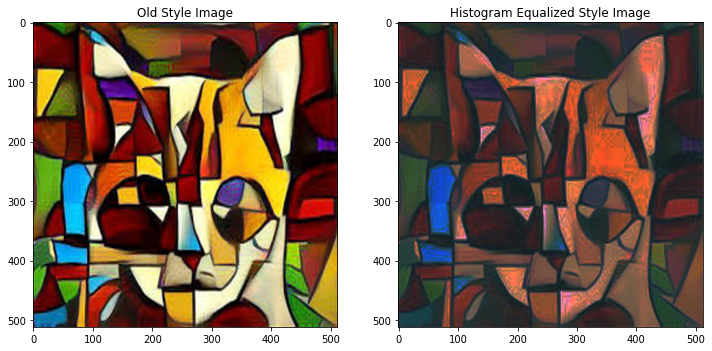

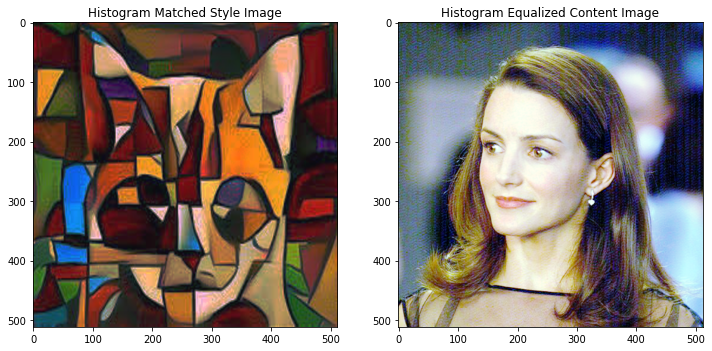

In [ ]:
if MODE == "normal":
  

  # For getting desired size of the output image
  image_size = 512 if torch.cuda.is_available() else 128  # we have to use 512 if GPU is available else we use 128 for cpu.

  #Applying appropriate transformation to our image such as Resize, ToTensor
  Image_Transform = transforms.Compose(
      [transforms.Resize(image_size),                     # scale imported image
      transforms.ToTensor()])                             # here we transform it into a torch tensor

  # Image Loader Function (Load Image and Returns cuda tensor)
  def ImageLoader(image_name):   
  
    image = Image.open(image_name)               
    # Open the image and store in a variable.
  
    image = Image_Transform(image).unsqueeze(0)    
    #Calling Image_Transform with our image.
    #unsqueeze(0) is used to add extra layer of dimensionality to the image. 
    #fake batch dimension required to fit network's input dimensions.                                              
  
    return image.to(device, torch.float)                  
    #Returning image   
    # .to Method is used to move tensors or modules to a desired device.


  # Taking Style and Content Image from google drive folder
  image_location = "/content/drive/MyDrive/BE_PROJECT_IMAGES/"
  content_image = ImageLoader(image_location + "content_images/contentImage2.png") 
  style_image = ImageLoader(image_location + "style_images/styleImage22.jpg")

  # Checking size(content image must be equal to  style image size)
  assert style_image.size() == content_image.size(), \
  "We have to import style and content images of equal size."

  
else:

  # For getting desired size of the output image
  image_size = 512 if torch.cuda.is_available() else 128  # we have to use 512 if GPU is available else we use 128 for cpu.

  #Applying appropriate transformation to our image such as Resize, ToTensor
  Image_Transform = transforms.Compose(
      [transforms.Resize(image_size),                     # scale imported image
      transforms.ToTensor()])                             # here we transform it into a torch tensor

  # Image Loader Function (Load Image and Returns cuda tensor)
  def ImagetoTensor(image):   
    
    #image = Image.open(image_name)               
    # Open the image and store in a variable.
    
    image = Image_Transform(image).unsqueeze(0)    
    #Calling Image_Transform with our image.
    #unsqueeze(0) is used to add extra layer of dimensionality to the image. 
    #fake batch dimension required to fit network's input dimensions.                                              
    
    return image.to(device, torch.float)                  
    #Returning image   
    # .to Method is used to move tensors or modules to a desired device.


  Image_Transform_resize = transforms.Compose(
      [transforms.Resize(image_size)])


  # Image Loader Function (Load Image and Returns cuda tensor)
  def ImageLoader(image_name):   
    
    image = Image.open(image_name)               
    # Open the image and store in a variable.
    
    image = Image_Transform_resize(image)  
    #Calling Image_Transform with our image.
    #unsqueeze(0) is used to add extra layer of dimensionality to the image. 
    #fake batch dimension required to fit network's input dimensions.                                              
    
    return image                  
    #Returning image   
    # .to Method is used to move tensors or modules to a desired device.

  # Taking Style and Content Image from google drive folder
  image_location = "/content/drive/MyDrive/BE_PROJECT_IMAGES/"
  content_image_copy = ImageLoader(image_location + "content_images/contentImage12.jpg") 
  style_image_copy = ImageLoader(image_location + "style_images/styleImage2.png")

  row = 1
  col = 2

  fig = plt.figure(figsize=(12, 6))
  fig.add_subplot(row, col, 1)
  plt.imshow(style_image_copy)
  plt.title("Old Style Image")

  # Checking size(content image must be equal to  style image size)
  #assert style_image_copy.size() == content_image_copy.size(), \
  "We have to import style and content images of equal size."

  (new_style_image, equalized_style_image, equalized_content_image) = histogram_equalization(style_image_copy,content_image_copy)

  fig.add_subplot(row, col, 2)
  plt.imshow(equalized_style_image)
  plt.title("Histogram Equalized Style Image")
  
  fig1 = plt.figure(figsize=(12, 6))
  fig1.add_subplot(row, col, 1)
  plt.imshow(new_style_image)
  plt.title("Histogram Matched Style Image")

  fig1.add_subplot(row, col, 2)
  plt.imshow(equalized_content_image)
  plt.title("Histogram Equalized Content Image")

## Image Histogram Plotting

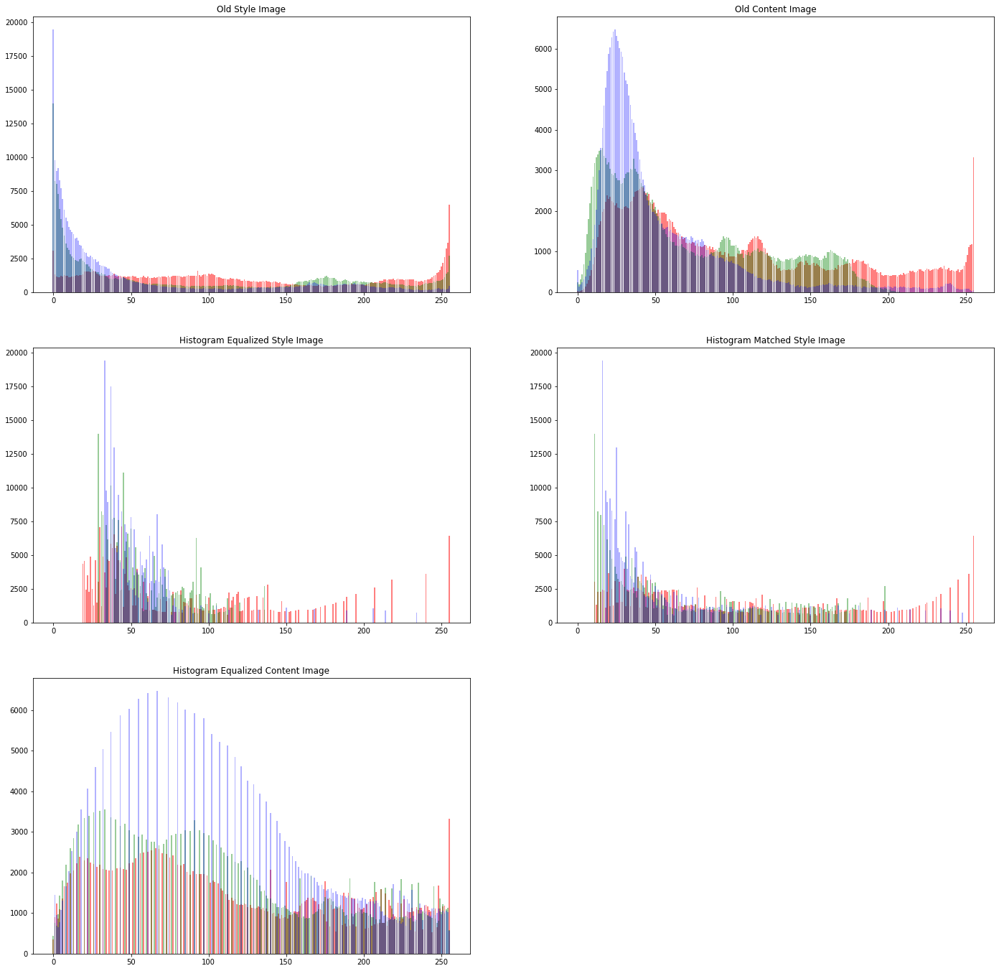

In [ ]:
def plot_histogram():

  image_list = [style_image_copy, content_image_copy, equalized_style_image, new_style_image, equalized_content_image]
  title_list = ["Old Style Image", "Old Content Image", "Histogram Equalized Style Image", "Histogram Matched Style Image", "Histogram Equalized Content Image"]

  hist_row = 3
  hist_col = 2

  fig = plt.figure(figsize=(24, 24))
  for j in range(0, (hist_row*hist_col)-1):
      fig.add_subplot(hist_row, hist_col, j+1)
      pl = image_list[j].histogram()
      plt.bar(range(256), pl[:256], color='r', alpha=0.5)
      plt.bar(range(256), pl[256:2*256], color='g', alpha=0.4)
      plt.bar(range(256), pl[2*256:], color='b', alpha=0.3)
      plt.title(title_list[j])

if MODE =="histogram":
  plot_histogram()
  content_image = ImagetoTensor(content_image_copy)
  style_image = ImagetoTensor(new_style_image)


Text(0.5, 1.0, 'Content Image  (512x512)')

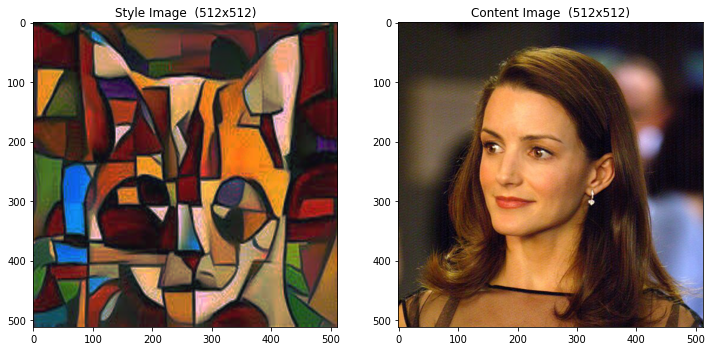

In [ ]:
# Here, we create a function that displays an image by reconverting a copy of it to PIL format and
# displaying the copy using plt.imshow.
image_store_list = []
title_store_list = []
row = 1
col = 2

unloader = transforms.ToPILImage()   # Reconvert into PIL Image

plt.ion()

def DisplayImage(tensor, title=None):
  
  image = tensor.cpu().clone()                      # we clone the tensor to not do changes on it
  image = image.squeeze(0)                          # remove the fake batch dimension
  image = unloader(image)
  #image_store_list.append(image)
  #plt.imshow(image)
  #if title is not None:
    #title_store_list.append(title)
    #plt.title(title)
  plt.pause(0.001)
  return image, title
                    # pause a bit so that plots are updated
style_image_return, style_title_return = DisplayImage(style_image, title="Style Image  ("+str(image_size)+"x"+str(image_size)+")")

content_image_return, content_title_return = DisplayImage(content_image, title="Content Image  ("+str(image_size)+"x"+str(image_size)+")")

fig = plt.figure(figsize=(12, 6))
fig.add_subplot(row, col, 1)
plt.imshow(style_image_return)
plt.title(style_title_return)

fig.add_subplot(row, col, 2)
plt.imshow(content_image_return)
plt.title(content_title_return)

#fig = plt.figure(figsize=(12, 6))

#for j in range(0, row*col):
#  fig.add_subplot(row, col, j+1)
#  plt.imshow(image_store_list[j])
#  plt.title(title_store_list[j])
  


## Loss Functions


###Content Loss

1.A Combination Image is the final output having style representation of Style Image and Content Representation of the Content Image.

2.The Higher Layers of the CNN Pipeline captures the essence of the content of the image i.e it captures the overall structural representation of the content of the image so quantitative difference between content image and combination image will be needed.

3.To get the Content Representation of the content image it will be passed to the pretrained VGG-19 network and one of the higher convolution layers will be finalized to capture the content.

4.The Activation Maps from this convolution layer should be known before hand so that when the combination image is being processed we can calculate the Content loss by calculating the distance between 
Activation Maps (Combination Image) & Activation Maps(Content Image)

In [ ]:
class Content_Loss(nn.Module):
  
  def __init__(self, target_content_img):

    super(Content_Loss, self).__init__()
    self.target_content_img = target_content_img.detach()                 #Returns a new Tensor, detached from the current graph, 
                                                                          #so that gradient for this variable is not calculated during backpropagation.
                                                                          #The result will never require gradient.
  def forward(self, input):       
    
    self.loss = F.mse_loss(input, self.target_content_img)                #MSE LOSS IS TO BE USED 
    return input                                  

### Gram Matrix

1. Used to measure the degree of correlation between different features of an image.

2. In CNN every filter kernel extracts a particular feature from an image 

3. Filter kernel is a matrix of size n x n which is flattened into a vector of size  n x n. Like this there are m filter kernels flattened & arranged in row wise forming a matrix 

4. The matrix multiplication between the above matrix & its transpose matrix is the gram matrix.

5. Each element of this gram matrix contains correlation measure of all the channels with respect to each other.



In [ ]:
def gram_matrix(input_image_Fmap):
  
    a, b, c, d = input_image_Fmap.size()                    # a = batch size(= 1)
                                                            # b = number of feature maps
                                                            # (c,d) = dimensions of a f. map (N=c*d)

    features = input_image_Fmap.view(a * b, c * d)          #reshaping the tensor

    G = torch.mm(features, features.t())                    # here the gram product is being computed

                                                            # we 'normalize' the values of the gram matrix by dividing by the number of element in each feature maps.
    return G.div(a * b * c * d)                             # This normalization is to counteract the fact that the matrices with a large dimension yield larger
                                                            # values in the Gram matrix.

    #return G.div(torch.numel(G))

    #return G

### Style Loss

1. The content loss function ensures that the activations of the higher layers are similar between the content image and the generated image. 

2. The style loss function makes sure that the correlation of activations in all the layers are similar between the style image and the generated image.

3. To calculate the style loss between the target and the style images, you take the mean squared distances between their gram matrices at each of the convolutional layers' blocks.

Now the style loss module looks almost exactly like the content loss module.

In [ ]:
class Style_Loss(nn.Module):

    def __init__(self, target_style_img_Fmap):
      
        super(Style_Loss, self).__init__()

        self.target = gram_matrix(target_style_img_Fmap).detach()

    def forward(self, input):

        G = gram_matrix(input)
        
        self.loss = F.l1_loss(G, self.target)
        
        return input


## Imporing the model 

Pretrained VGG 19 has been used here. VGG is trained on 1 million images from the ImageNet database. It has been used to get better accuracy to detect the fetaures.

In [ ]:
cnn = models.vgg19(pretrained=True).features.to(device).eval()

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

##Unwrapping the VGG-19 model and seeing all the sub-layers

In [ ]:
i=0
block_no_counter=1
conv_no_counter = 0
for layers in cnn.children():
  
  if isinstance(layers, nn.Conv2d):
      i += 1
      conv_no_counter += 1
      block_no = 'block_'+ str(block_no_counter) 
      layer_name = '\t conv_{} \t{}'.format(str(i),block_no + '_conv_' + str(conv_no_counter))
      print(layers,layer_name)

  elif isinstance(layers, nn.ReLU):
      print(layers)
      
  else:
      print(layers)
      block_no_counter+=1
      conv_no_counter = 0

Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)) 	 conv_1 	block_1_conv_1
ReLU(inplace=True)
Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)) 	 conv_2 	block_1_conv_2
ReLU(inplace=True)
MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)) 	 conv_3 	block_2_conv_1
ReLU(inplace=True)
Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)) 	 conv_4 	block_2_conv_2
ReLU(inplace=True)
MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)) 	 conv_5 	block_3_conv_1
ReLU(inplace=True)
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)) 	 conv_6 	block_3_conv_2
ReLU(inplace=True)
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)) 	 conv_7 	block_3_conv_3
ReLU(inplace=True)
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)) 	 co

## Image Normalization
1. VGG networks are trained on images with each channel
      normalized by 


            mean = [0.485, 0.456, 0.406] and 

            standard deviation = [0.229, 0.224, 0.225].
2. We will use them to normalize the image before sending it into the network.




In [ ]:
vgg_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
vgg_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

# create a module to normalize input image so we can easily put it in a nn.Sequential
# .view the mean and std to make them [C x 1 x 1] so that they can directly work with image Tensor of shape [B x C x H x W].

# B is batch size.

# C is number of channels.

# H is height.

# W is width.


class Normalization(nn.Module):

    def __init__(self, mean, std):

        super(Normalization, self).__init__()
        
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, image):    
                                                  
        return (image - self.mean) / self.std # normalize image

## Assembling the Sequential Pipeline / Model

### Function to build the model

In [ ]:
image_type = '0'  #image_type = 0 or 1 or 2
if image_type == '0':   # standard
  style_layers_select = ['conv_1','conv_3','conv_5', 'conv_7', 'conv_9', 'conv_11']
elif image_type == '1':
  style_layers_select = ['conv_1','conv_2','conv_4', 'conv_6', 'conv_7', 'conv_8']
else:
  style_layers_select = ['conv_2','conv_4','conv_7', 'conv_8', 'conv_9', 'conv_13']

In [ ]:

content_layers_default = ['conv_8']                                                             # desired depth layers to compute content losses :
#style_layers_default = ['conv_1','conv_3','conv_5', 'conv_7', 'conv_9', 'conv_11']                       # desired depth layers to compute style losses   : 


def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_image, content_image,
                               content_layers=content_layers_default, 
                               style_layers=style_layers_select):
  

    # just in order to have an iterable access to or list of content/syle
    # loss objects which has losses from individual layers
    content_losses = []
    style_losses = []
  

    #content_losses.clear()         # Clearing the lists for every new call to this function
    
    #style_losses.clear()


    # normalization module
    normalization = Normalization(normalization_mean, normalization_std).to(device)
    # assuming that cnn is a nn.Sequential, so we make a new nn.Sequential
    # to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(normalization)

    i = 0  # increment every time we see a conv
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

      
        if name in content_layers:
            target_content_Fmap = model(content_image).detach()                        # passing target content image to the model to obtain Feature Maps from layer considered to calc Content Loss
            content_loss = Content_Loss(target_content_Fmap)                           # initializing object of Content Loss Class where the Content loss will be calculated
            model.add_module('Content_Loss_{}'.format(i),content_loss)
            content_losses.append(content_loss)                                        # appending the objects (of Content Loss class) to a list
                                                                                       # so that the content losses at various stages can be accessed directly

        if name in style_layers:
            target_style_Fmap = model(style_image).detach()                            # passing target style image to the model to obtain Feature Maps from layer considered to calc Style Loss
            style_loss = Style_Loss(target_style_Fmap)                                 # initializing object of Style Loss Class where the Style loss will be calculated
            model.add_module('Style_Loss_{}'.format(i),style_loss)      
            style_losses.append(style_loss)                                            # appending the objects (of Content Loss class) to a list
                                                                                       # so that the content losses at various stages can be accessed directly
        
                                                        
    for i in range(len(model) - 1, -1, -1):                                            # removing the layers after the last occurence of content loss or style loss object
        if isinstance(model[i], Content_Loss) or isinstance(model[i], Style_Loss):
            break

    model = model[:(i + 1)]

    #print(model)

    return model, style_losses, content_losses

    #return model

    

##Next, we select the input image. We can use a copy of the content image or white noise.

Text(0.5, 1.0, 'Input Image')

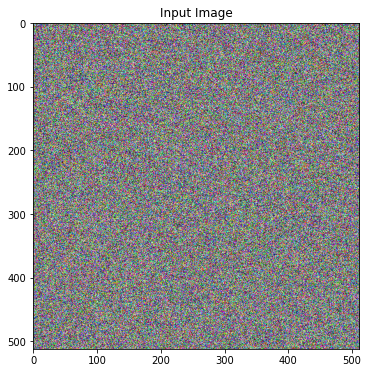

In [ ]:
#input_img = content_img.clone()

input_img = torch.randn(content_image.data.size(), device=device)   # Initializing a White Noise Image which will be transformed into an artistic image
noise_image = input_img
# add the original input image to the figure:

image, title = DisplayImage(input_img, title='Input Image')
plt.figure(figsize=(6, 6))
plt.imshow(image)
plt.title(title)


## Gradient Descent

### Typically we train the Neural Network but here we will not be training the network, instead we will train the input image every epoch i.e. optimizing it so as to get minimum style and content loss

In [ ]:
def get_input_image_optimizer(input_img):
    
    optimizer = optim.LBFGS([input_img])          # Initializing an optimizer 
    return optimizer

###Stylization Constants

In [ ]:
STYLE_WT = 10000                 # style weight
CONTENT_WT = 20                # content weight
ITERATIONS = 1000                # number of optimization steps the input image goes through

Finally, we define a function that performs the neural style transfer. For
each iteration of the network, it is fed an updated input image and computes
new losses. We will run the ``backward`` methods of each loss module to compute their gradients.

We still have one final constraint to address. The network may try to
optimize the input with values that exceed the 0 to 1 tensor range for
the image. We can address this by correcting the input values to be
between 0 to 1 each time the network is run.

In [ ]:
style_score_list = []
content_score_list = []
run_count_list = []

def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_image, style_image, input_img, num_steps=ITERATIONS,
                       style_weight=STYLE_WT, content_weight=CONTENT_WT):
  
    print('Building the neural style transfer model..')               

    
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_image, content_image)     # Calling the function which builds the sequential pipeline and return it alogn with list
                                                                               # of style loss objects and content loss objects

    
    input_img.requires_grad_(True)                                             # We want to optimize the input and not the model parameters so we
                                                                               # update all the requires_grad fields accordingly
    model.requires_grad_(False)

    optimizer = get_input_image_optimizer(input_img)                           # Get the Optimizer

    print('Optimizing the input image...')
    run = [0]
    while run[0] <= num_steps:

        def closure():
            
            with torch.no_grad():
                input_img.clamp_(0, 1)                                         # correct the values of updated input image

            optimizer.zero_grad()                                              # Making the gradients from previous iteration zero
       
            style_score = 0   
            content_score = 0                                    

            
            model(input_img)                                                   # Feeding the input image to the assembled model / sequential pipeline

            

            for sl in style_losses:
                style_score += sl.loss

            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            total_loss = style_score + content_score
            total_loss.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print("run {}:".format(run))
                print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                    style_score.item(), content_score.item()))
                
                
                result_image, result_title = DisplayImage(input_img, title='Input Image')
                plt.figure(figsize=(6, 6))
                
                plt.imshow(result_image)
                plt.title(result_title)
                
                
                run_count_list.append(float(run[0]))
                styleScore = float(style_score)
                contentScore = float(content_score)
              
                style_score_list.append(styleScore)
                content_score_list.append(contentScore)

                
            return total_loss

        optimizer.step(closure)

    # a last correction...
    with torch.no_grad():
        input_img.clamp_(0, 1)

    return input_img

### Running the Neural Style Transfer and visualizing the Output i.e. Generated Artistic Image

Building the neural style transfer model..


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


Optimizing the input image...
run [50]:
Style Loss : 907.881104 Content Loss: 620.380127
run [100]:
Style Loss : 579.059814 Content Loss: 523.647400


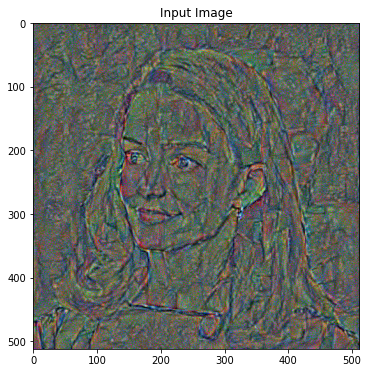

run [150]:
Style Loss : 459.945099 Content Loss: 477.225464


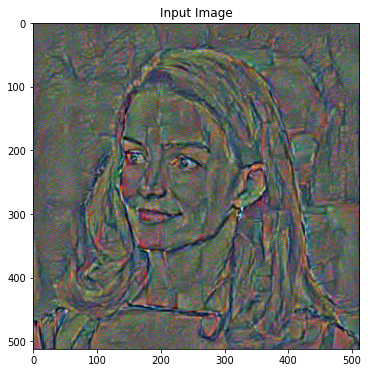

run [200]:
Style Loss : 401.335571 Content Loss: 451.476379


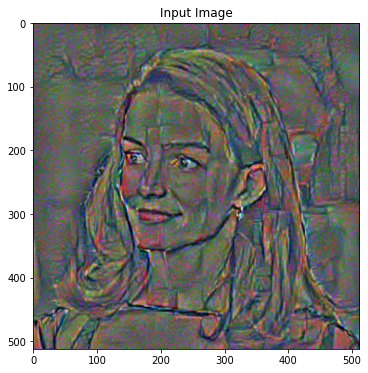

run [250]:
Style Loss : 367.243469 Content Loss: 434.081543


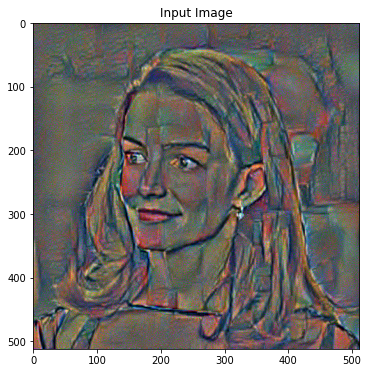

run [300]:
Style Loss : 343.290070 Content Loss: 421.966614


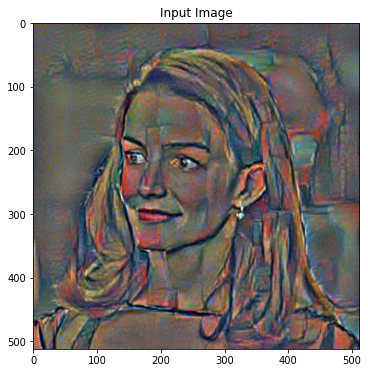

run [350]:
Style Loss : 324.000336 Content Loss: 413.354034


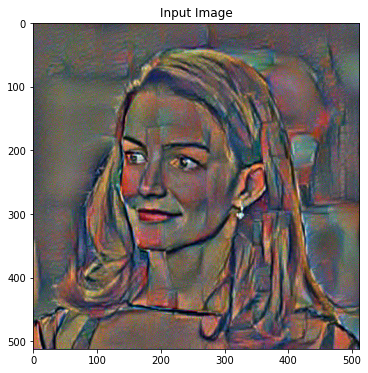

run [400]:
Style Loss : 310.532288 Content Loss: 406.235992


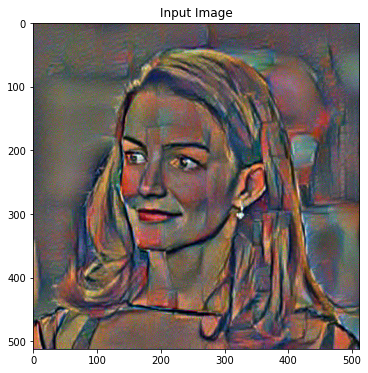

run [450]:
Style Loss : 298.027893 Content Loss: 400.444977


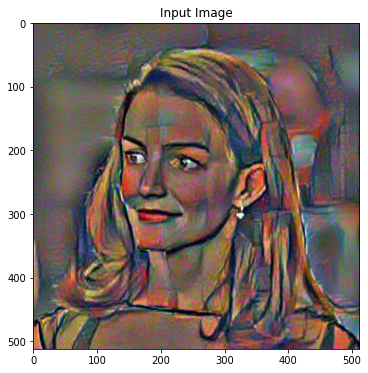

run [500]:
Style Loss : 289.855103 Content Loss: 395.926178


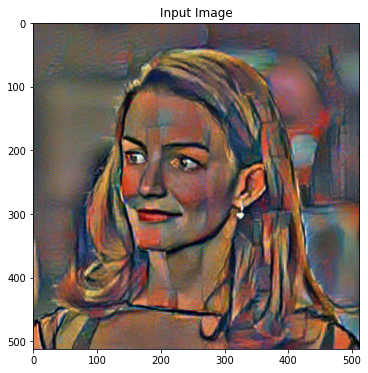

run [550]:
Style Loss : 281.802002 Content Loss: 390.228851


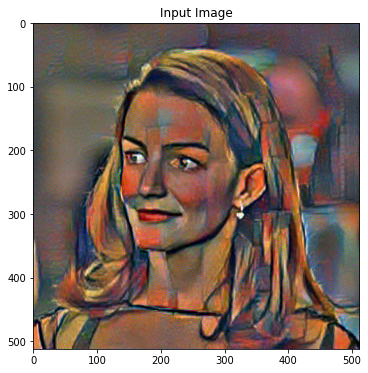

run [600]:
Style Loss : 275.387115 Content Loss: 388.016296


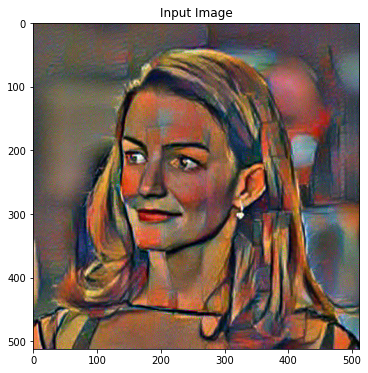

run [650]:
Style Loss : 298.613525 Content Loss: 401.921722


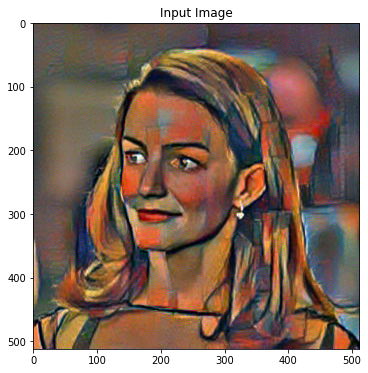

run [700]:
Style Loss : 270.491150 Content Loss: 388.242737


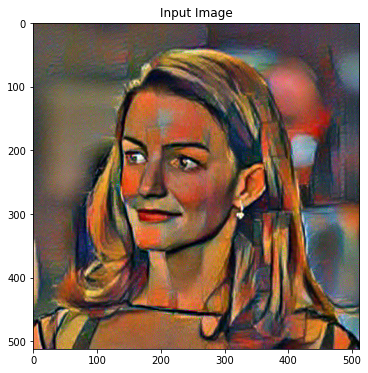

run [750]:
Style Loss : 273.756653 Content Loss: 389.299316


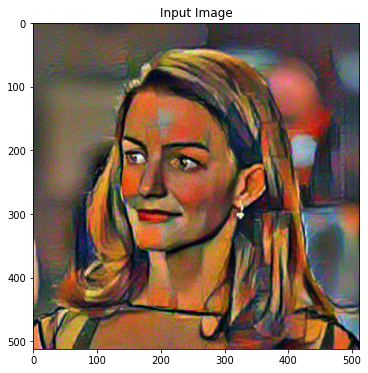

run [800]:
Style Loss : 262.440399 Content Loss: 379.753357


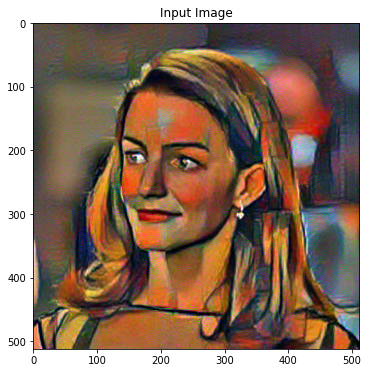

run [850]:
Style Loss : 1173.992798 Content Loss: 598.903687


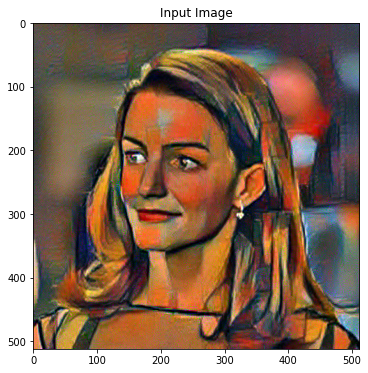

run [900]:
Style Loss : 359.895050 Content Loss: 404.824554


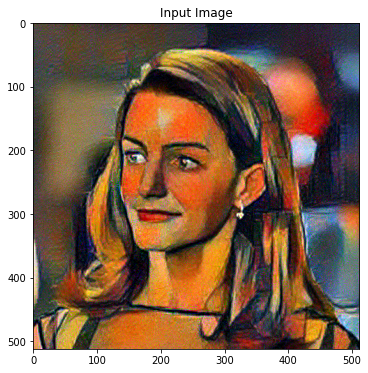

run [950]:
Style Loss : 287.669189 Content Loss: 385.328217


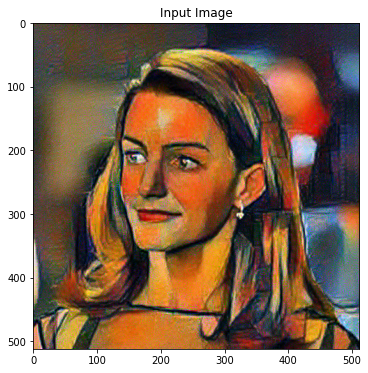

run [1000]:
Style Loss : 265.790894 Content Loss: 376.468964


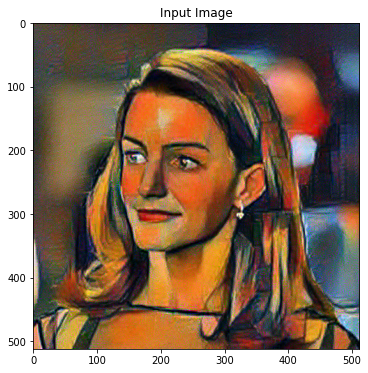

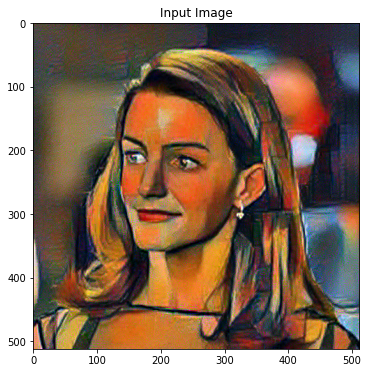

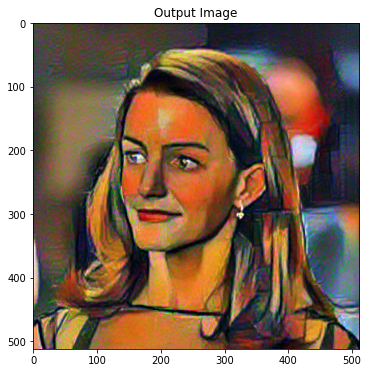

In [ ]:
output = run_style_transfer(cnn, vgg_normalization_mean, vgg_normalization_std,content_image, style_image, input_img)

  #5.34
result_image, result_title = DisplayImage(output, title='Output Image')
plt.figure(figsize=(6, 6))
plt.imshow(result_image)
plt.title(result_title)
   
plt.ioff()


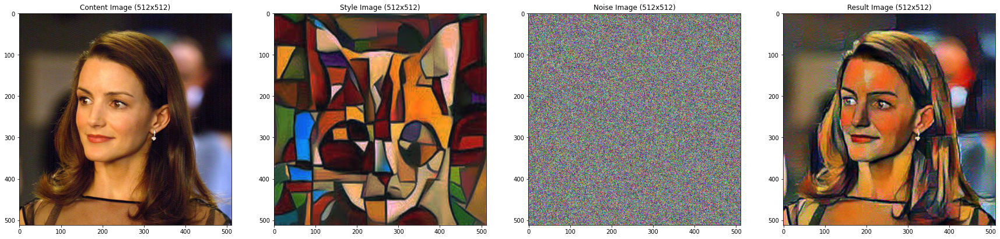

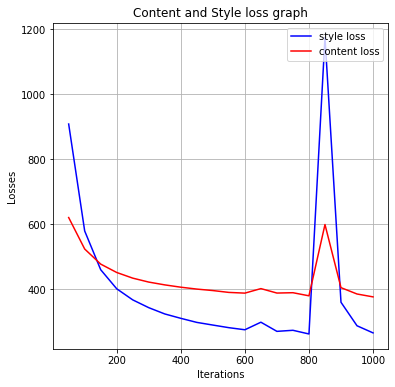

In [ ]:
def final_result_func():
  
  result_images_list = []
  result_title_list = []

  result_images_list.append(content_image_return)
  result_images_list.append(style_image_return)
  result_images_list.append(image)
  result_images_list.append(result_image)

  result_title_list.append('Content Image (' + str(image_size) + 'x' + str(image_size) + ')' )
  result_title_list.append('Style Image (' + str(image_size) + 'x' + str(image_size) + ')' )
  result_title_list.append('Noise Image (' + str(image_size) + 'x' + str(image_size) + ')' )
  result_title_list.append('Result Image (' + str(image_size) + 'x' + str(image_size) + ')' ) 

  result_row = 1
  result_col = 4
  fig = plt.figure(figsize=(30, 30))

  for j in range(0, (result_row*result_col)):
    fig.add_subplot(result_row, result_col, j+1)
    plt.imshow(result_images_list[j])
    plt.title(result_title_list[j])

def plotting_graph():

  plt.figure(figsize=(6,6))
  plt.plot(run_count_list, style_score_list, '-b', label='style loss')
  plt.plot(run_count_list, content_score_list, '-r', label='content loss')
  plt.xlabel("Iterations")
  plt.ylabel("Losses")
  #plt.ylim(0,5)
  plt.legend(loc='upper right')
  plt.grid(True, linestyle='-')
  plt.title('Content and Style loss graph')
  plt.show()

final_result_func()
plotting_graph()